In [398]:
import os
import cv2
import glob
from glob import glob
import numpy as np
import pandas as pd
import keras
import tensorflow as tf
import matplotlib.pyplot
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from multiprocessing import Pool, cpu_count
from PIL import ImageFilter, ImageStat, Image, ImageDraw
from IPython.display import display

In [397]:
print(cpu_count())

12


In [28]:
basepath = '/home/dataset/train/'

all_cervix_images = []

for path in sorted(glob(basepath + "*")):
    #print(path)
    cervix_type = path.split("/")[-1]
    #print(cervix_type)
    cervix_images = sorted(glob(basepath + cervix_type + "/*"))
    #print(cervix_images)
    all_cervix_images = all_cervix_images + cervix_images

all_cervix_images = pd.DataFrame({'imagepath': all_cervix_images})
all_cervix_images['filetype'] = all_cervix_images.apply(lambda row: row.imagepath.split(".")[-1], axis=1)
all_cervix_images['type'] = all_cervix_images.apply(lambda row: row.imagepath.split("/")[-2], axis=1)
all_cervix_images.head()

,imagepath,filetype,type
0,/home/dataset/train/Type_1/0.jpg,jpg,Type_1
1,/home/dataset/train/Type_1/10.jpg,jpg,Type_1
2,/home/dataset/train/Type_1/1013.jpg,jpg,Type_1
3,/home/dataset/train/Type_1/1014.jpg,jpg,Type_1
4,/home/dataset/train/Type_1/1019.jpg,jpg,Type_1


In [149]:
def sub_func_load_img(abspath_img):
    img_rgb = cv2.cvtColor(cv2.imread(abspath_img), cv2.COLOR_BGR2RGB)
    return img_rgb

In [147]:
def show_img(abspath_img):
    matplotlib.pyplot.imshow(sub_func_load_img(abspath_img))
    matplotlib.pyplot.show()

In [30]:
def im_multi(path):
    try:
        print(path)
        im_stats_im_ = cv2.imread(path)
        #print(im_stats_im_.size)
        return [path, {'size': im_stats_im_.size}]
    except:
        print("Error path:%s"%(path))
        return [path, {'size': [0,0]}]

In [238]:
def im_stats(im_stats_df):
    im_stats_d = {}
    p = Pool(cpu_count())
    ret = p.map(im_multi, im_stats_df['path'])
    for i in range(len(ret)):
        print(ret[i][0])
        im_stats_d[ret[i][0]] = ret[i][1]
    im_stats_df['size'] = im_stats_df['path'].map(lambda x: ' '.join([str(s) for s in str(im_stats_d[x]['size'])]))
    return im_stats_df

In [368]:
def get_im_cv2(args):
    img = cv2.imread(args[0])
    resized = cv2.resize(img, (args[1], args[1]), cv2.INTER_LINEAR)
    return [args[0], resized]

In [399]:
def image_features(paths, dim):
    imf_d = {}
    p = Pool(cpu_count())
    dims = [dim for i in range(len(paths.tolist()))]
    params = list(zip(paths.tolist(), dims))
    ret = p.map(get_im_cv2, params)
    for i in range(len(ret)):
        imf_d[ret[i][0]] = ret[i][1]
    ret = []
    fdata = [imf_d[f] for f in paths]
    fdata = np.array(fdata)
    return fdata

In [389]:
train = glob.glob('/home/dataset/train/**/*.jpg')# + glob.glob('/data/kaggle/additional/**/*.jpg')
train =\
pd.DataFrame([[p.split('/')[3],p.split('/')[4],p] for p in train], columns = ['type','image','path'])#[:40]

In [390]:
train_ = im_stats(train)

/home/dataset/train/Type_3/477.jpg
/home/dataset/train/Type_3/770.jpg
/home/dataset/train/Type_3/669.jpg
/home/dataset/train/Type_3/872.jpg
/home/dataset/train/Type_3/1207.jpg
/home/dataset/train/Type_3/944.jpg
/home/dataset/train/Type_3/1081.jpg
/home/dataset/train/Type_3/1120.jpg
/home/dataset/train/Type_3/731.jpg
/home/dataset/train/Type_3/962.jpg
/home/dataset/train/Type_3/193.jpg
/home/dataset/train/Type_3/1375.jpg
/home/dataset/train/Type_3/1153.jpg
/home/dataset/train/Type_3/806.jpg
/home/dataset/train/Type_3/335.jpg
/home/dataset/train/Type_3/277.jpg
/home/dataset/train/Type_3/324.jpg
/home/dataset/train/Type_3/1053.jpg
/home/dataset/train/Type_3/327.jpg
/home/dataset/train/Type_3/1403.jpg
/home/dataset/train/Type_3/898.jpg
/home/dataset/train/Type_3/217.jpg
/home/dataset/train/Type_3/1063.jpg
/home/dataset/train/Type_3/98.jpg
/home/dataset/train/Type_3/196.jpg
/home/dataset/train/Type_3/1286.jpg
/home/dataset/train/Type_3/945.jpg
/home/dataset/train/Type_3/799.jpg
/home/datase

In [401]:
dim = 64
train_1 = train_[train_['size'] != '0 0'].reset_index(drop=True) #remove bad images
train_data = image_features(train_1['path'], dim)
#np.save('train.npy', train_data, allow_pickle=True, fix_imports=True)

In [412]:
dim = 64
def showX(X, dim):
    int_X = X[:,:,:,::-1]
    int_X_reshape = int_X.reshape(-1,dim,dim,3).swapaxes(0,1).reshape(dim,-1,3)
    display(Image.fromarray(int_X_reshape))
#showX(train_data, dim)

In [403]:
train_data[0].shape

(64, 64, 3)

In [410]:
train_data[:,:,:,::-1].shape

(1481, 64, 64, 3)

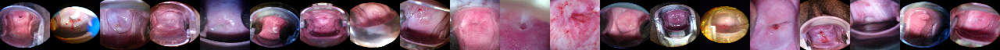

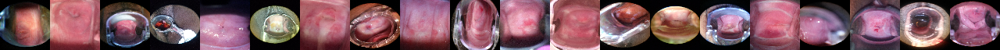

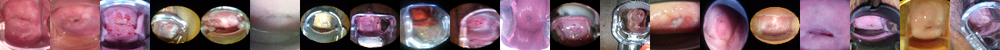

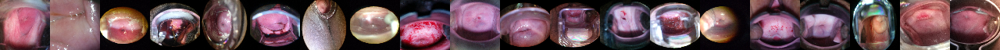

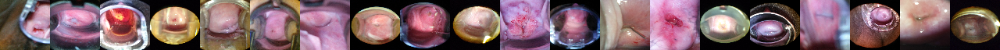

...

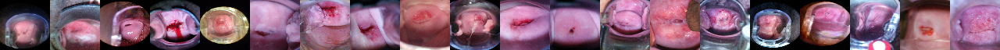

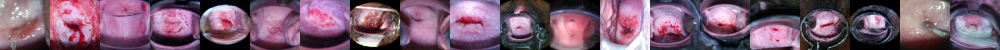

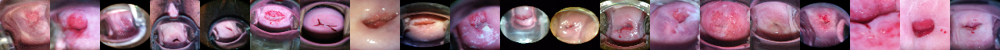

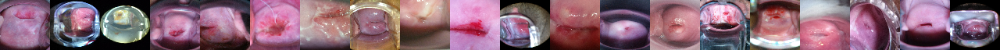

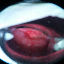

In [413]:
for i in range(0,train_data.shape[0],20):
    showX(train_data[i:i+20], dim)